In [1]:
#Import section
from datetime import date
import os
import pandas as pd
import matplotlib.ticker as ticker
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import matplotlib.pyplot as plt
import datetime
import seaborn as sns

In [2]:
#File to process
logs_dir = 'chib2bprdcst06 Logs 25 & 26 April 2021/'
files_name = 'WMERROR_20210425_055521.log'

#logs_dir = 'From TEST/'
#files_name = 'WMERROR_20210601_000007.log'

In [3]:
#Reading the file into a list of array of error messages
error_messages = []
array_error = []
with open((logs_dir+files_name),'r') as fp:
    fileline = fp.readline()
    while fileline:
        if fileline.startswith("WMERROR"):
            error_messages.append(array_error)
            array_error = []
            array_error.append(fileline)
        else:
            array_error.append(fileline)
        fileline = fp.readline()
    error_messages.append(array_error)
if error_messages[0] == []:
    error_messages.pop(0)

In [4]:
#Transforming the array of error messages into a DataFrame
cols = ['Type','Root Context','FieldNull','Parent Context','Current Context','ServerId','Timestamp1','Timestamp2','error_message','ServiceName','ServiceStack']
logs_df = pd.DataFrame(columns = cols)

for error in error_messages:
    row_cols = []
    for i, row in enumerate(error):
        if(i == 0):
            row_cols = row.split(None, 8)
        else:
            #This is the last line of the error
            if(i == len(error) - 1):
                row_cols[8] = row_cols[8] + row
                truncatedIndex = row_cols[8].find('...<truncated>',len(row_cols[8])//2)
                if(truncatedIndex >= 0):
                    truncatedIndex = truncatedIndex + 14
                    last2col = row_cols[8][truncatedIndex:].split(None, 1)
                    row_cols[8] = row_cols[8][:truncatedIndex]
                    row_cols = row_cols + last2col
                else:
                    last2col = row.rsplit(None, 2)
                    row_cols = row_cols + last2col[-2:]
            else:
                row_cols[8] = row_cols[8] + row
    logs_df.loc[len(logs_df)] = row_cols

In [5]:
#Enhancing the dataframe content
logs_df['Timestamp1'] = pd.to_datetime(logs_df['Timestamp1'])
logs_df['Timestamp2'] = pd.to_datetime(logs_df['Timestamp2'])
logs_df = logs_df.set_index('Current Context')
logs_df.head(2)

,Type,Root Context,FieldNull,Parent Context,ServerId,Timestamp1,Timestamp2,error_message,ServiceName,ServiceStack
Current Context,,,,,,,,,,
528f8830-2472-28b1-132e-35798d5a5ac7,WMERROR,a77dd991-ce10-4576-9112-69cd24fb5ea1, ,a77dd991-ce10-4576-9112-69cd24fb5ea1,Chib2bprdcst06.uschecom.net:5080,2021-04-25 09:55:20.926000+00:00,2021-04-25 09:55:21.473000+00:00,[ISS.0098.9006] No matching Document Type exis..., , 
52e12b83-f71d-51e9-7542-8d2c096ee314,WMERROR,7ae35f59-64ac-43b8-8972-810c9b8ed4fd, ,7ae35f59-64ac-43b8-8972-810c9b8ed4fd,Chib2bprdcst06.uschecom.net:5080,2021-04-25 09:55:20.926000+00:00,2021-04-25 09:55:21.489000+00:00,[ISS.0098.9006] No matching Document Type exis..., , 


In [6]:
# Creating the CountVectorizer over the error log messages
count_vectorizer = CountVectorizer()
sparse_matrix = count_vectorizer.fit_transform(logs_df['error_message'].array)

#Converting the Sparse Matrix to Pandas Dataframe to get word frequencies.
doc_term_matrix = sparse_matrix.todense()
cv_df = pd.DataFrame(doc_term_matrix, 
                  columns=count_vectorizer.get_feature_names(),
                  index=logs_df.index.array)

cv_df.index.names = ['Current Context']
cv_df.head()

,00,000010,000026,0005,0098,02,04,06,09,100,...,util,validateprocessor,value,violation,webmethods,wm,wmnotification,write,you,your
Current Context,,,,,,,,,,,,,,,,,,,,,
528f8830-2472-28b1-132e-35798d5a5ac7,0,0,0,0,2,0,0,0,0,0,...,1,0,0,0,0,16,0,0,0,0
52e12b83-f71d-51e9-7542-8d2c096ee314,0,0,0,0,2,0,0,0,0,0,...,1,0,0,0,0,16,0,0,0,0
f15b1684-dde2-f0f2-c968-15f1cf9389f3,0,0,0,0,0,0,0,0,0,1,...,2,2,0,0,2,24,0,2,2,4
943f3a61-a33e-bba9-df59-a76d5186b74c,0,0,0,0,0,0,0,0,0,0,...,1,2,5,6,0,38,0,0,0,0
ea62f677-1696-c12d-471c-7e78a0220e24,0,0,0,0,0,0,0,0,0,0,...,1,2,5,6,0,38,0,0,0,0


In [7]:
cv_support_df = logs_df[['Timestamp1','ServiceName']]
cv_support_df.head()

,Timestamp1,ServiceName
Current Context,,
528f8830-2472-28b1-132e-35798d5a5ac7,2021-04-25 09:55:20.926000+00:00, 
52e12b83-f71d-51e9-7542-8d2c096ee314,2021-04-25 09:55:20.926000+00:00, 
f15b1684-dde2-f0f2-c968-15f1cf9389f3,2021-04-25 10:03:53.345000+00:00,wm.tn.admin:startup
943f3a61-a33e-bba9-df59-a76d5186b74c,2021-04-25 10:03:57.404000+00:00,wm.tn.docattr:add
ea62f677-1696-c12d-471c-7e78a0220e24,2021-04-25 10:03:57.405000+00:00,wm.EDIINT.util:init


Text(0.5, 1.0, 'Number of errors per hour')

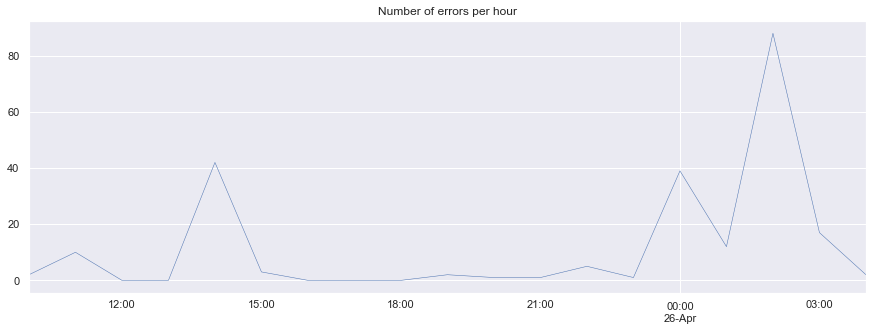

In [8]:
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(15, 5)})

logs_df_by_hr = cv_support_df.groupby(cv_support_df['Timestamp1'].dt.ceil('H')).count()
logs_df_by_hr = logs_df_by_hr.drop(columns=['Timestamp1'])
logs_df_by_hr.columns = ['ErrorCountInHr']

idx = pd.date_range(logs_df_by_hr.iloc[0].name, logs_df_by_hr.iloc[-1].name, freq="H")

logs_df_by_hr = logs_df_by_hr.reindex(idx, fill_value=0)

logs_df_by_hr['ErrorCountInHr'].plot(linewidth=0.5).set_title('Number of errors per hour')


In [9]:
#Obtaining the Cosine Similarities counts for all log entries against all log entries expressed in the Vectorizer df
cosine_similarities = cosine_similarity(cv_df, cv_df)
cosine_similarities_labels = cv_support_df.index.values
similarity_rate, similarity_counts = np.unique(cosine_similarities, return_counts=True)

In [10]:
#Validating a similariry rate has the same service name
def get_first_context(similarity_rate, cosine_similarities):
    first_occurrence = []
    for uniq_sim in similarity_rate:
        for sim_array in cosine_similarities:
            if uniq_sim in sim_array:
                first_occurrence.append(cosine_similarities_labels[list(sim_array).index(uniq_sim)])
                break
    return first_occurrence

In [11]:
#Resetting the index
cv_df['Timestamp1'] = pd.to_datetime(cv_support_df['Timestamp1'],utc=None)
cv_df = cv_df.reset_index()
cv_df = cv_df.set_index('Timestamp1')
cv_df = cv_df.drop(columns=['Current Context'])
cv_df.head()

,00,000010,000026,0005,0098,02,04,06,09,100,...,util,validateprocessor,value,violation,webmethods,wm,wmnotification,write,you,your
Timestamp1,,,,,,,,,,,,,,,,,,,,,
2021-04-25 09:55:20.926000+00:00,0,0,0,0,2,0,0,0,0,0,...,1,0,0,0,0,16,0,0,0,0
2021-04-25 09:55:20.926000+00:00,0,0,0,0,2,0,0,0,0,0,...,1,0,0,0,0,16,0,0,0,0
2021-04-25 10:03:53.345000+00:00,0,0,0,0,0,0,0,0,0,1,...,2,2,0,0,2,24,0,2,2,4
2021-04-25 10:03:57.404000+00:00,0,0,0,0,0,0,0,0,0,0,...,1,2,5,6,0,38,0,0,0,0
2021-04-25 10:03:57.405000+00:00,0,0,0,0,0,0,0,0,0,0,...,1,2,5,6,0,38,0,0,0,0


In [12]:
base_date = cv_support_df.iloc[0]['Timestamp1']
base_date = datetime.datetime(base_date.year, base_date.month, base_date.day)

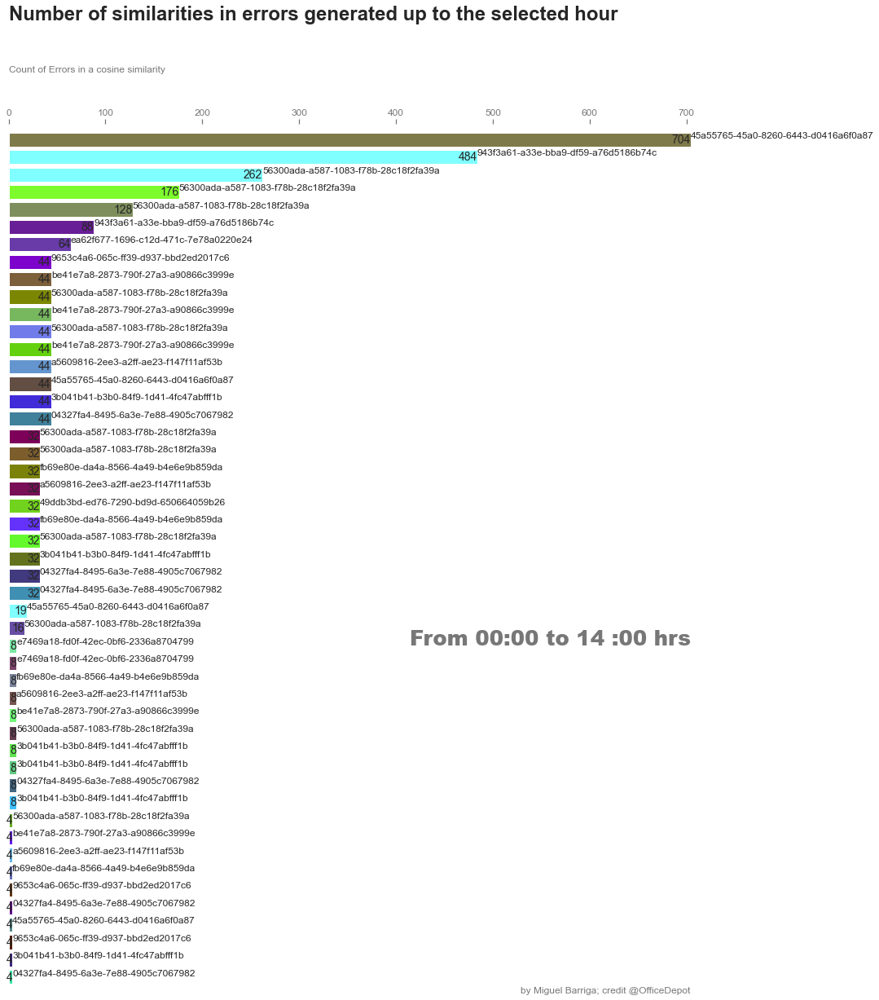

In [13]:
fig, ax = plt.subplots(figsize=(15, 1))

def draw_barchart(hour):
    #Initializing
    similarity_rate_hr = []
    similarity_counts_hr = []
    cosine_similarities_by_hr_labels = []
    hex_color = []
    
    #Setting up the dataframe to use for the hour specified
    start_date = base_date + datetime.timedelta(hours=0)
    end_date = base_date + datetime.timedelta(hours=hour)
    logs_in_range = cv_df.loc[(cv_df.index >= str(start_date)) & (cv_df.index < str(end_date))]
    
    #Calculate the cosine_similarity, get unique rates, find the first context in those similarities
    if len(logs_in_range) > 0:
        cosine_similarities_by_hr = cosine_similarity(logs_in_range, logs_in_range)
        similarity_rate_hr, similarity_counts_hr = np.unique(cosine_similarities_by_hr, return_counts=True)
        cosine_similarities_by_hr_labels = get_first_context(similarity_rate_hr, cosine_similarities_by_hr)
        #print(similarity_rate_hr)
        #print(similarity_counts_hr)
        
        #Filtering the similarities with 2 or more counts, since the cosine_similarity function compares with itself
        filter_count = (similarity_counts_hr > 2)# & (similarity_counts_hr//2 < len(logs_in_range))
    
        similarity_rate_hr = similarity_rate_hr[filter_count]
        similarity_counts_hr = similarity_counts_hr[filter_count]
    
    #sorting the values
    if len(similarity_rate_hr) > 0:
        zipped = zip(similarity_rate_hr, similarity_counts_hr, cosine_similarities_by_hr_labels)
        zipped = list(zipped)
        sorted_similarities = np.array(sorted(zipped, key = lambda x: x[1]))
        similarity_rate_hr = sorted_similarities[:,0].astype('float')
        similarity_counts_hr = sorted_similarities[:,1].astype('int')
        cosine_similarities_by_hr_labels = sorted_similarities[:,2].astype('str')
    
        hex_color = ["#"+format(i, 'x') for i in (similarity_rate_hr*8388607).astype(int)]
        fig.set_figheight(len(similarity_counts_hr)/2.5)
        
        threshold = similarity_counts_hr.mean() + similarity_counts_hr.std() * 3
        #if len(similarity_counts_hr[similarity_counts_hr > threshold]) > 0:
        #    print('Alert!!!')
    
    ax.clear()
    ax.barh(np.array(similarity_rate_hr, dtype=np.str), similarity_counts_hr, color=hex_color)
    
    for i, (value_count, label) in enumerate(zip(similarity_counts_hr, cosine_similarities_by_hr_labels)):
        ax.text(value_count, i,     label,        size=12,           ha='left',  va='bottom')
        ax.text(value_count, i,     value_count,  size=14,           ha='right', va='center') 
    
    # ... polished styles
    ax.text(1, 0.4, "From 00:00 to "+str(hour)+" :00 hrs", transform=ax.transAxes, color='#777777', size=26, ha='right', weight=800)
    ax.text(0, 1.06, 'Count of Errors in a cosine similarity', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    #ax.set_yticks(cosine_similarities_by_hr_labels)
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, 'Number of similarities in errors generated up to the selected hour',
            transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'by Miguel Barriga; credit @OfficeDepot', transform=ax.transAxes, ha='right',
            color='#777777', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
draw_barchart(14)

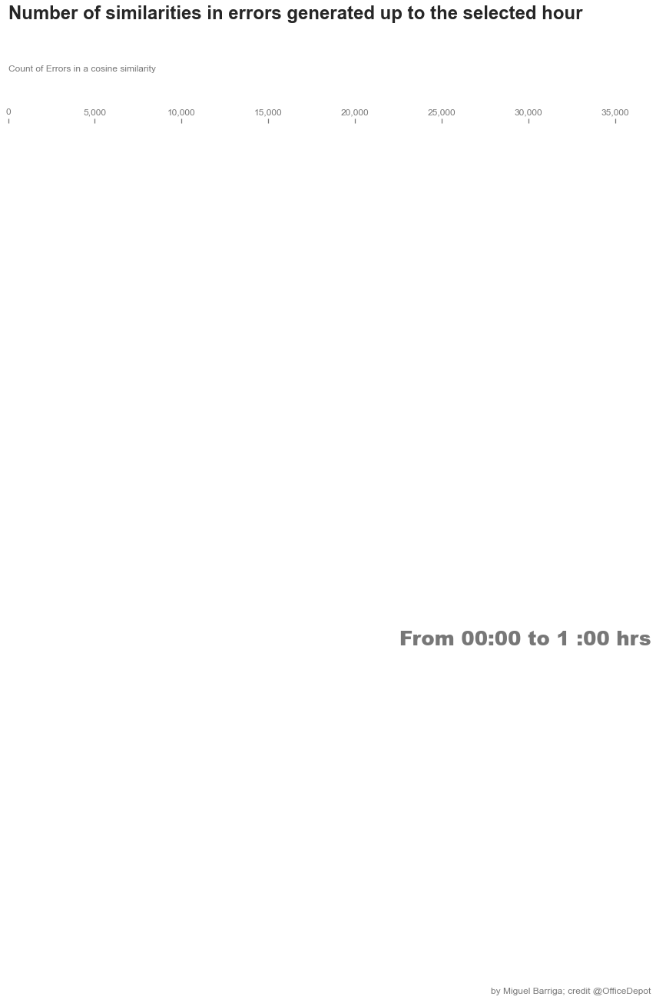

In [14]:
import matplotlib.animation as animation
from IPython.display import HTML
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=range(1, 48))
HTML(animator.to_jshtml()) 
# or use animator.to_html5_video() or animator.save()